In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame
#import descartes
#import folium

In [5]:
df = pd.read_csv('datasets/1870_1933_geocoded.csv', index_col=0)
df.head(3)

,YR,DIR,PG,TYPE,NAME,ADDY,BOROUGH,CITY,STATE,HOUSENO,...,NamePrismSecondClass,NamePrismThirdClass,NO,STREET,street_clean,num_clean,addresses,Coordinates,Lat,Lon
0,1920,Phillip's,1186.0,NaN,Lutes Restaurant Inc.,51 W 14 St.,NaN,New York,New York,51,...,"European,German","European,Italian,Romania",51.0,W 14 St.,W 14th Street,51.0,W 14th Street 51.0,"(40.73690624504976, -73.99427368597173)",40.736906,-73.994274
1,1915,Philips,1013.0,Restaurants,Saxer J. J. Jr.,51 W. 14 St.,Manhattan,New York,New York,51,...,"Hispanic,Spanish","Hispanic,Portuguese",51.0,W. 14 St.,W 14th Street,51.0,W 14th Street 51.0,"(40.73690624504976, -73.99427368597173)",40.736906,-73.994274
2,1905,Trow's,1378.0,Restaurants,Fisher Brothers,51 W. 14 St.,Manhattan,New York,New York,51,...,"African,SouthAfrican","European,Russian",51.0,W. 14 St.,W 14th Street,51.0,W 14th Street 51.0,"(40.73690624504976, -73.99427368597173)",40.736906,-73.994274


In [25]:
df.shape

(14664, 39)

In [26]:
df.columns

Index(['YR', 'DIR', 'PG', 'TYPE', 'NAME', 'ADDY', 'BOROUGH', 'CITY', 'STATE',
       'HOUSENO', 'STNAME', 'STNAME.1', 'STNAME.2', 'ST_PREFIX', 'ST_SUFFIX',
       'AdrMod', 'STNAME.3', 'STNAME.4', 'last_name', 'census_match_full',
       'census_match_1', 'census_match_1p', 'first_name',
       'census_match_full_2', 'census_match_2', 'census_match_2p',
       'NamePrismResponse', 'NamePrismFirstClass', 'NamePrismSecondClass',
       'NamePrismThirdClass', 'NO', 'STREET', 'street_clean', 'num_clean',
       'addresses', 'Coordinates', 'Lat', 'Lon', 'geometry'],
      dtype='object')

In [29]:
def convert_nationality(region):
    if (region == 'New York') or (region == 'Pennsylvania') or (region == 'West Indies')\
        or (region == 'Virginia') or (region == 'New Jersey') or (region == 'South Carolina')\
        or (region == 'Georgia') or (region == 'Colorado') or (region == 'Ohio')\
        or (region == 'Tennessee') or (region == 'Rhode Island') or (region == 'Indiana')\
        or (region == 'Connecticut') or (region == 'Michigan') or (region == 'Maine')\
        or (region == 'Maryland') or (region == 'North Carolina ') or (region == 'Florida')\
        or (region == 'DC') or (region == 'Kentucky') or (region == 'Massachusetts')\
        or (region == 'New Hampshire') or (region == 'Louisiana') or (region == 'California')\
        or (region == 'Iowa') or (region == 'Missouri') or (region == 'Illinois')\
        or (region == 'US') or (region == 'Barbados') or (region == 'Texas') or (region == 'North Carolina')\
            or (region == 'Vermont') or (region == 'Delaware') or (region == 'Canada'):
        return 'American'
    elif (region == 'Russia') or (region == 'Hungary') or (region == 'Romania')\
            or (region == 'Poland') or (region == 'Bohemia'):
        return 'Eastern European'
    elif (region == 'Germany') or (region == 'Austria') or (region == 'Switzerland'):
        return 'Germanic'
    elif (region == 'Ireland') or (region == 'England') or (region == 'Scotland'):
        return 'British'
    elif (region == 'Italy') or (region == 'Spain') or (region == 'Greece'):
        return 'Southern European'
    elif (region == 'France') or (region == 'Holland') or (region == 'Luxembourg'):
        return 'Western European'
    elif (region == 'Sweden') or (region == 'Finland') or (region == 'Norway') or (region == 'Denmark'):
        return 'Scandinavian'
    elif (region == 'China'):
        return 'Asian'
    elif (region == 'Turkey'):
        return 'Middle Eastern'
    else:
        return 'False'

In [31]:
df['census_match_1_group'] = df['census_match_1'].apply(convert_nationality)
df['census_match_2_group'] = df['census_match_2'].apply(convert_nationality)

In [22]:
census = pd.read_csv('datasets/census_1910_manhattan.csv')
census.head(3)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3050: DtypeWarning: Columns (37) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,DataID,RecordId,Name,First Name,Middle Name,Surname,HouseHoldId,Street Name,House Number,Dwelling Number,...,Deaf and Dumb,Enumeration District Number,Ward of City,Street Name New,House Number New,Address,Lat,Lon,Full Occupation,Occupation Score
0,4450087_00350,18356998,Frank Collomeger,Frank,NaN,Collomeger,18356998,Twenty-First Street,224-6,10.0,...,False,972,18,21st street,225.0,21st street 225,NaN,NaN,Hotel Chef,33.06
1,4450087_00350,100952045,Villa Collomeger,Villa,NaN,Collomeger,18356998,Twenty-First Street,224-6,10.0,...,False,972,18,21st street,225.0,21st street 225,NaN,NaN,NaN,NaN
2,4450087_00350,18356999,Kate Gerighly,Kate,NaN,Gerighly,18356999,Twenty-First Street,224-6,10.0,...,False,972,18,21st street,225.0,21st street 225,NaN,NaN,NaN,NaN


In [23]:
census.shape

(1034722, 46)

In [24]:
census.columns

Index(['DataID', 'RecordId', 'Name', 'First Name', 'Middle Name', 'Surname',
       'HouseHoldId', 'Street Name', 'House Number', 'Dwelling Number',
       'Own or Rent', 'Relationship', 'Gender', 'Race', 'Age', 'Born Year',
       'Marital Status', 'Number of Years of Present Marriage',
       'Number of Children Born', 'Number of Children Living', 'Birthplace',
       'Father's Birthplace', 'Mother's Birthplace', 'US Born',
       'Immigration Year', 'Naturalization Status', 'Self Native Tongue',
       'Occupation', 'Industry', 'Self Employed or Not',
       'Out of Work on April 15', 'Number of Weeks Out of Work', 'Can Read',
       'Can Write', 'Attended School', 'Blind', 'Deaf and Dumb',
       'Enumeration District Number', 'Ward of City', 'Street Name New',
       'House Number New', 'Address', 'Lat', 'Lon', 'Full Occupation',
       'Occupation Score'],
      dtype='object')

In [63]:
census['Birthplace_group'] = census['Birthplace'].apply(convert_nationality)

In [12]:
street_map = gpd.read_file('road/road.shp')
street_map.head(3)

,accessible,avgtravtim,b5_sc,b7_sc,bike_lane,borough_in,boroughcod,bphys_id,collection,continuous,...,status,stname_lab,streetwi_1,streetwidt,to_level_c,trafdir,truck_rout,twisted_pa,within_bnd,geometry
0,None,0.0,305280,30528001,None,None,3,0.0,None,None,...,2,3 AV,None,0.0,13.0,TF,None,N,None,"LINESTRING (-73.98027 40.68596, -73.98070 40.6..."
1,None,0.0,447390,44739001,None,None,4,0.0,None,None,...,2,GRAND CENTRAL PKWY,None,45.0,13.0,FT,None,N,None,"LINESTRING (-73.84554 40.73966, -73.84537 40.7..."
2,None,0.0,389730,38973001,None,None,3,0.0,None,None,...,2,WASHINGTON AV,None,0.0,13.0,TW,None,N,None,"LINESTRING (-73.96582 40.68821, -73.96553 40.6..."


In [27]:
street_map.shape

(119977, 34)

In [28]:
street_map.columns

Index(['bike_lane', 'bike_trafd', 'borocode', 'date_creat', 'time_creat',
       'frm_lvl_co', 'full_stree', 'l_blkfc_id', 'l_high_hn', 'l_low_hn',
       'l_zip', 'date_modif', 'time_modif', 'physicalid', 'post_direc',
       'post_modif', 'post_type', 'pre_direct', 'pre_modifi', 'pre_type',
       'r_blkfc_id', 'r_high_hn', 'r_low_hn', 'r_zip', 'rw_type', 'shape_leng',
       'snow_pri', 'st_label', 'st_name', 'st_width', 'status', 'to_lvl_co',
       'trafdir', 'geometry'],
      dtype='object')

In [13]:
crs = {'init': 'epsg:4326'}
geometry = [Point(xy) for xy in zip(df['Lon'], df['Lat'])]
geo_df = gpd.GeoDataFrame(df, crs=crs, geometry=geometry)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


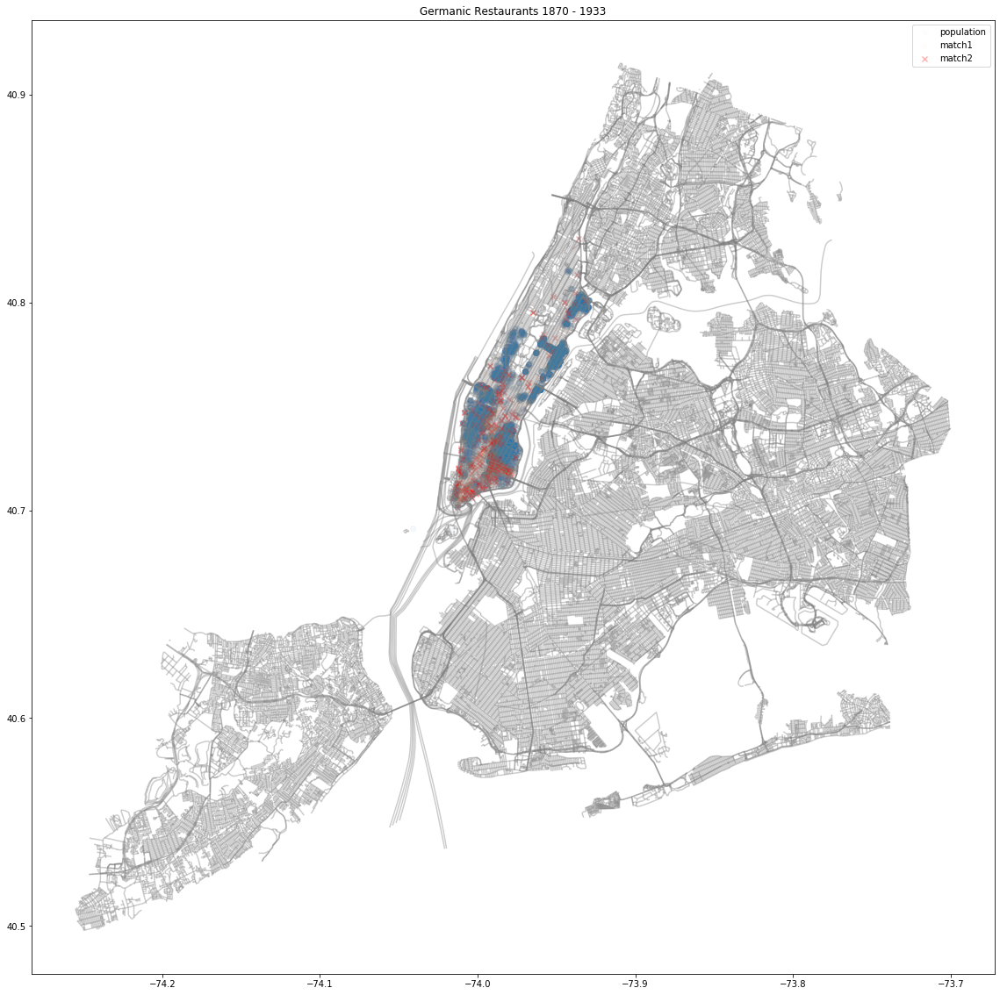

In [43]:
fig,ax = plt.subplots(figsize=(20,20))
street_map.plot(ax=ax, alpha=0.4, color='grey')
#geo_df[geo_df['fiveYearsProperty']==0].plot(ax=ax, color='red', label='0')
#geo_df[geo_df['fiveYearsProperty']==1].plot(ax=ax, color='blue', label='1')

x = census[census['Birthplace']=='Germany']['Lon']
y = census[census['Birthplace']=='Germany']['Lat']

x1 = df[df['census_match_1_group']=='Germanic']['Lon']
y1 = df[df['census_match_1_group']=='Germanic']['Lat']

x2 = df[df['census_match_2_group']=='Germanic']['Lon']
y2 = df[df['census_match_2_group']=='Germanic']['Lat']

plt.scatter(x, y, label='population', alpha=0.01, marker='o')
plt.scatter(x1, y1, label='match1', alpha=0.01, marker='o')
plt.scatter(x2, y2, label='match2', alpha=0.3, marker='x', color='r')
plt.title('Germanic Restaurants 1870 - 1933')
plt.legend()

#ax.set_xlim([-74, 73.9])
#ax.set_ylim([40.7, 40.8])

#plt.savefig('plots/German_census_restaurant.png')

In [46]:
street_map = gpd.read_file('manhattan/manhattan.shp')
street_map.head(3)

,statefp10,countyfp10,vtdst10,geoid10,vtdi10,name10,namelsad10,lsad10,mtfcc10,funcstat10,...,ag_10,uss_2_10,uss_6_10,av,ndv,nrv,cartodb_id,created_at,updated_at,geometry
0,36,061,97,3606197,P,6400097,Voting District 6400097,V1,G5240,S,...,0.723270,0.806250,0.807453,0.781536,137.550369,38.449635,687,2015-03-17,2015-03-17,"POLYGON ((-74.00684 40.70786, -74.00764 40.708..."
1,36,061,797,36061797,P,7100036,Voting District 7100036,V1,G5240,S,...,0.979592,0.968000,0.984556,0.977652,281.563751,6.436255,811,2015-03-17,2015-03-17,"POLYGON ((-73.94066 40.83473, -73.94351 40.835..."
2,36,061,156,36061156,P,6500059,Voting District 6500059,V1,G5240,S,...,0.655844,0.696774,0.689873,0.673389,124.577057,60.422943,961,2015-03-17,2015-03-17,"POLYGON ((-73.94901 40.77334, -73.95126 40.774..."


In [47]:
street_map.shape

(1118, 44)

In [48]:
street_map.columns

Index(['statefp10', 'countyfp10', 'vtdst10', 'geoid10', 'vtdi10', 'name10',
       'namelsad10', 'lsad10', 'mtfcc10', 'funcstat10', 'aland10', 'awater10',
       'intptlat10', 'intptlon10', 'oid_', 'geoid10_1', 'elect_id', 'pop100',
       'vap', 'gov_dvote_', 'gov_rvote_', 'comp_dvote', 'comp_rvote',
       'ag_dvote_1', 'ag_rvote_1', 'uss_2_dvot', 'uss_2_rvot', 'uss_6_dvot',
       'uss_6_rvot', 'sum_vap', 'vap_share', 'total', 'g_10', 'comp_10',
       'ag_10', 'uss_2_10', 'uss_6_10', 'av', 'ndv', 'nrv', 'cartodb_id',
       'created_at', 'updated_at', 'geometry'],
      dtype='object')

In [49]:
crs = {'init': 'epsg:4326'}
geometry = [Point(xy) for xy in zip(df['Lon'], df['Lat'])]
geo_df = gpd.GeoDataFrame(df, crs=crs, geometry=geometry)

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


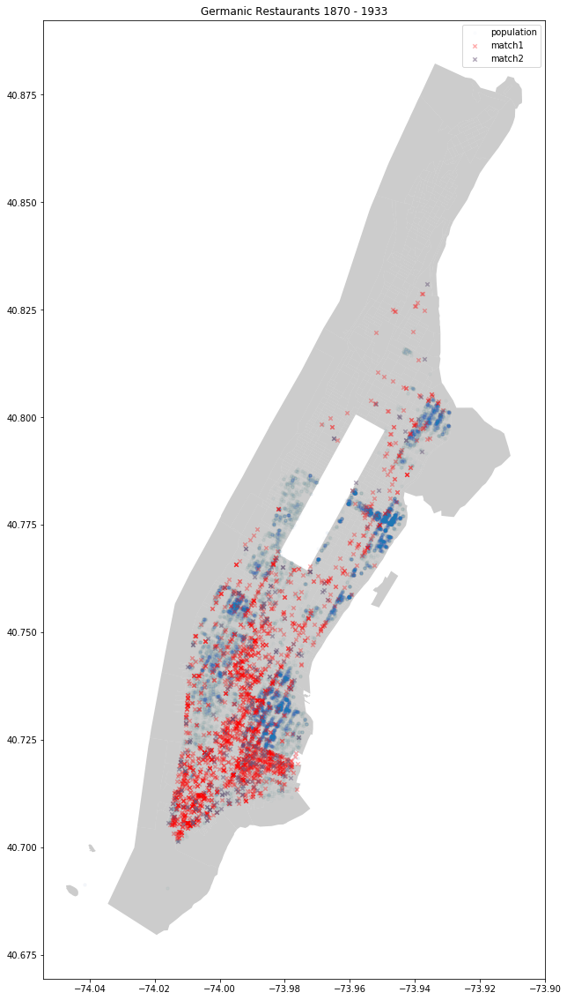

In [84]:
fig,ax = plt.subplots(figsize=(20,20))
street_map.plot(ax=ax, alpha=0.4, color='grey') #grey
#geo_df[geo_df['fiveYearsProperty']==0].plot(ax=ax, color='red', label='0')
#geo_df[geo_df['fiveYearsProperty']==1].plot(ax=ax, color='blue', label='1')

x = census[census['Birthplace']=='Germany']['Lon']
y = census[census['Birthplace']=='Germany']['Lat']

x1 = df[df['census_match_1_group']=='Germanic']['Lon']
y1 = df[df['census_match_1_group']=='Germanic']['Lat']

x2 = df[df['census_match_2_group']=='Germanic']['Lon']
y2 = df[df['census_match_2_group']=='Germanic']['Lat']

plt.scatter(x, y, label='population', alpha=0.01, marker='o', s=10)
plt.scatter(x1, y1, label='match1', alpha=0.3, marker='x', c='r', s=20)
plt.scatter(x2, y2, label='match2', alpha=0.5, marker='x', c='#6c5b7b', s=20)
plt.title('Germanic Restaurants 1870 - 1933')
plt.legend()

#ax.set_xlim([-74, 73.9])
#ax.set_ylim([40.7, 40.8])

#plt.savefig('plots/German_census_restaurant.png')

In [64]:
census['Birthplace_group'].value_counts()

American             467177
Eastern European     224998
Southern European    139879
Germanic             122331
British               57271
False                  6147
Western European       5917
Scandinavian           5418
Middle Eastern         3438
Asian                  2146
Name: Birthplace_group, dtype: int64

In [61]:
df['census_match_1_group'].value_counts()

False                4781
Eastern European     2734
American             2645
Germanic             2412
British               927
Southern European     828
Western European      145
Scandinavian           99
Asian                  64
Middle Eastern         29
Name: census_match_1_group, dtype: int64

In [62]:
df['YR'].value_counts()

1910    3399
1905    2837
1895    1755
1890    1437
1925    1338
1920    1210
1933    1010
1915     718
1870     505
1930     381
1885      74
Name: YR, dtype: int64

In [66]:
groups = set(census['Birthplace_group'])
years = set(df['YR'])

<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(20,20))
<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(20,20))
<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,

<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(20,20))
<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(20,20))
<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,

<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(20,20))
<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(20,20))
<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,

<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(20,20))
<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(figsize=(20,20))
<ipython-input-83-e511a38286f5>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,

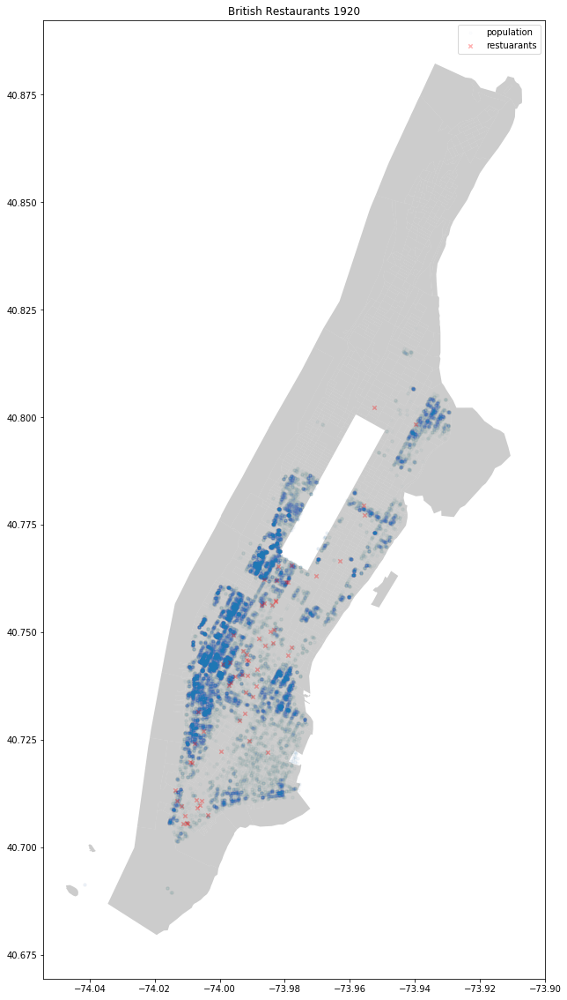

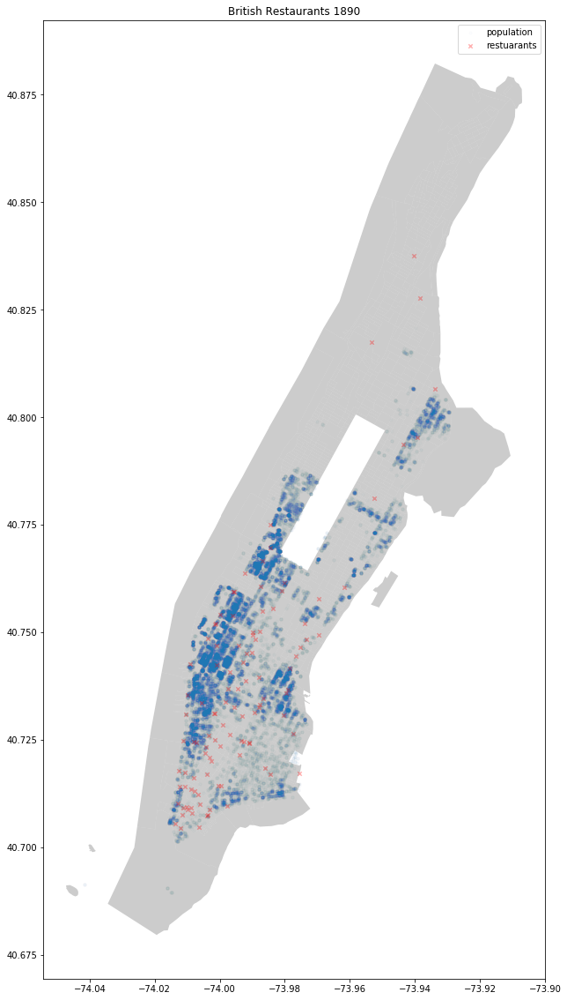

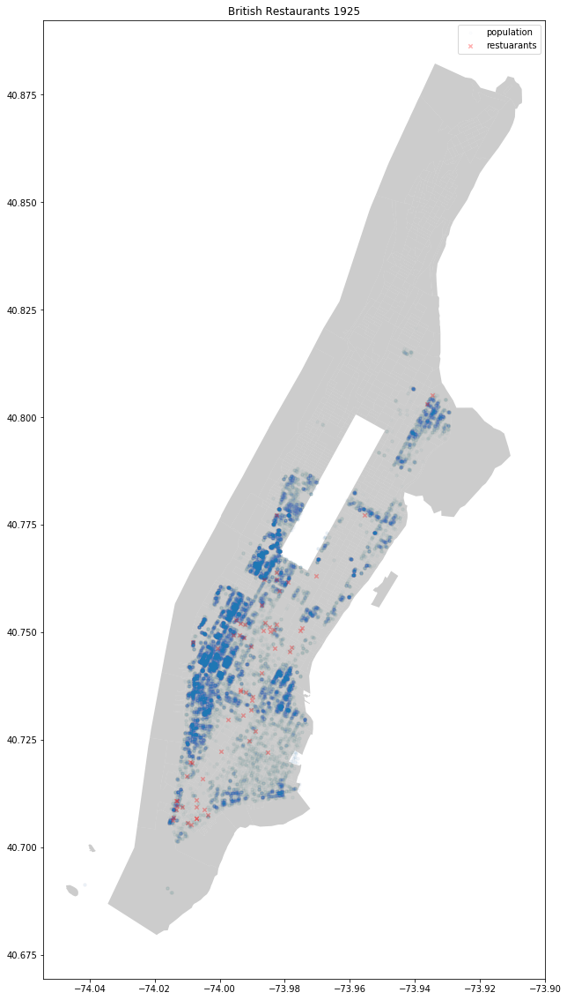

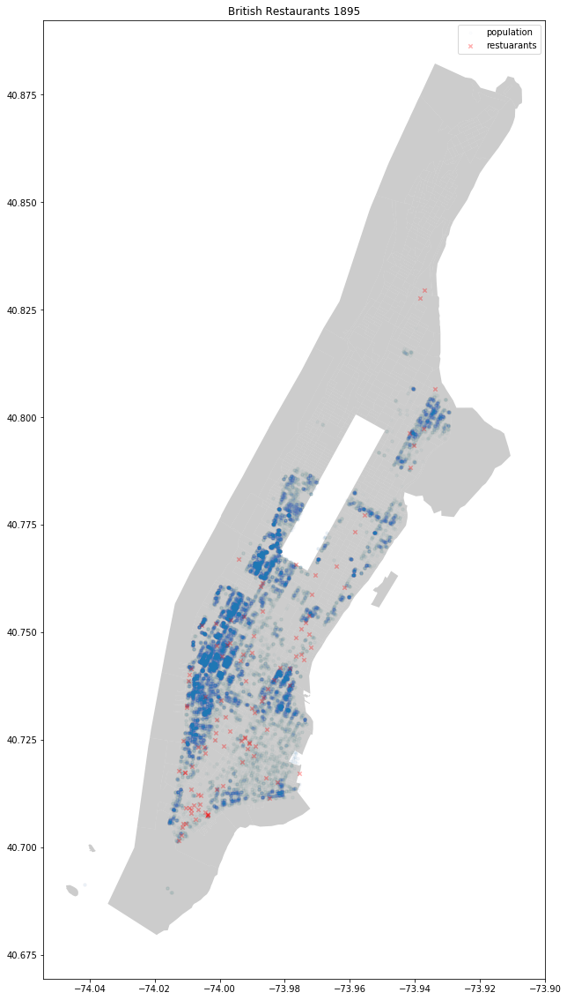

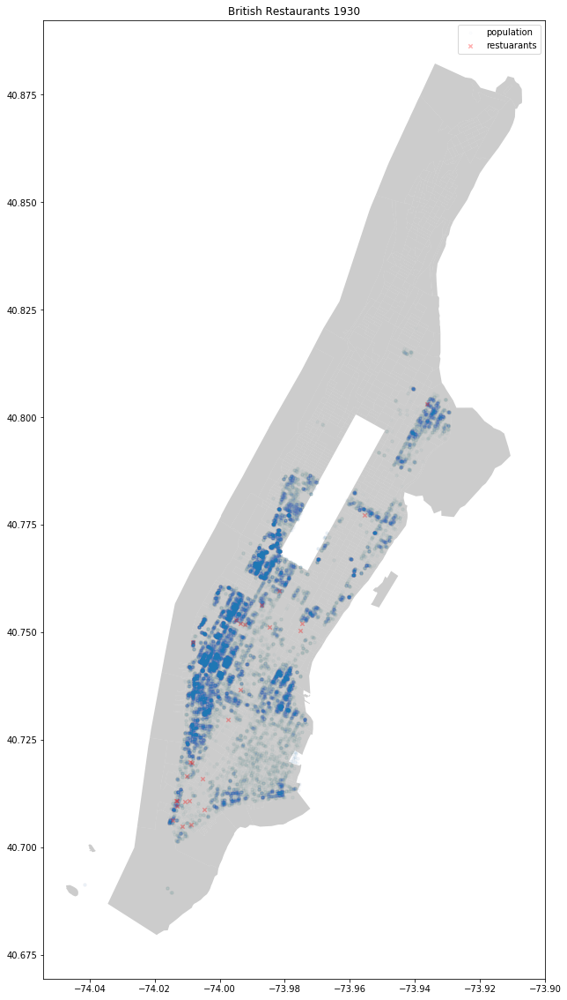

...

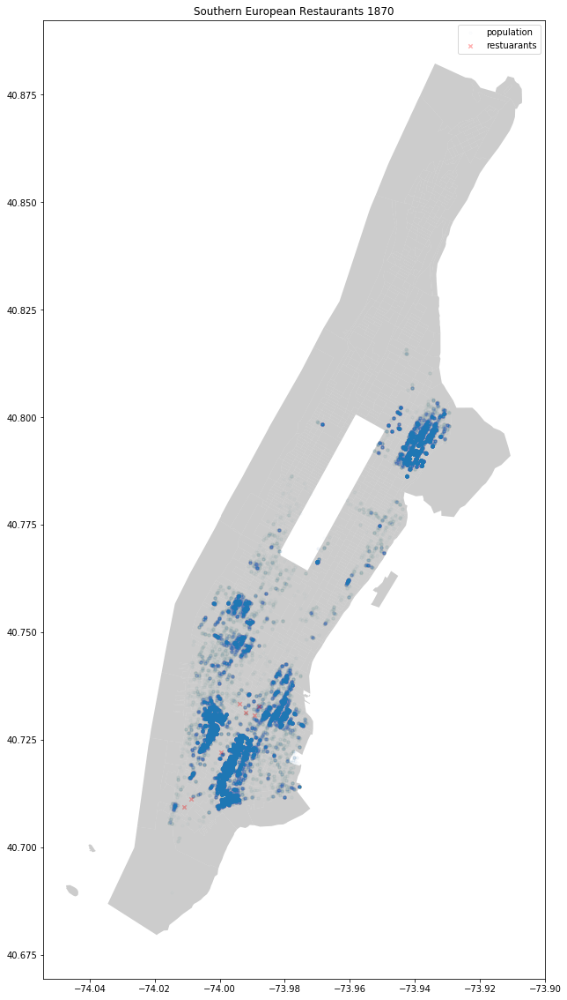

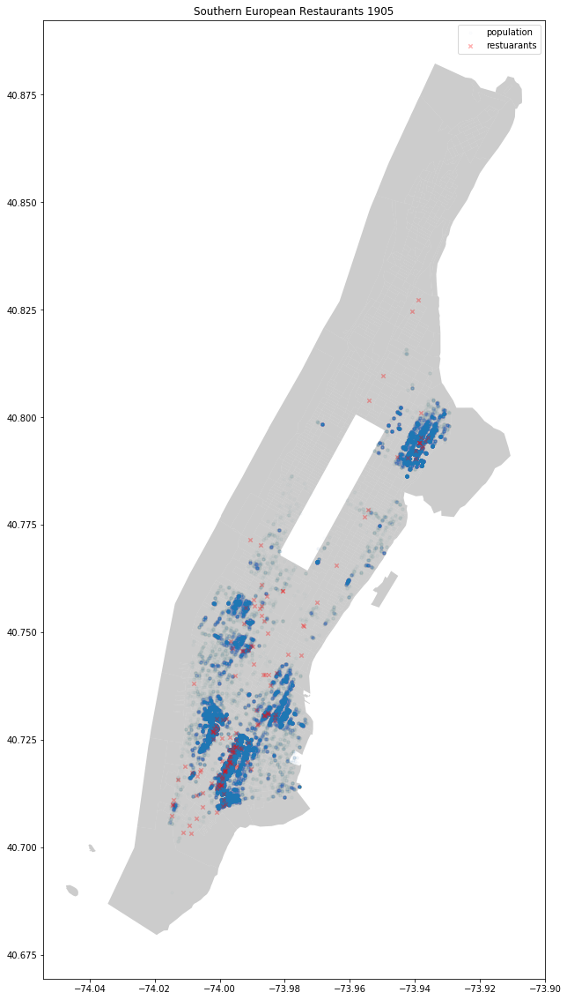

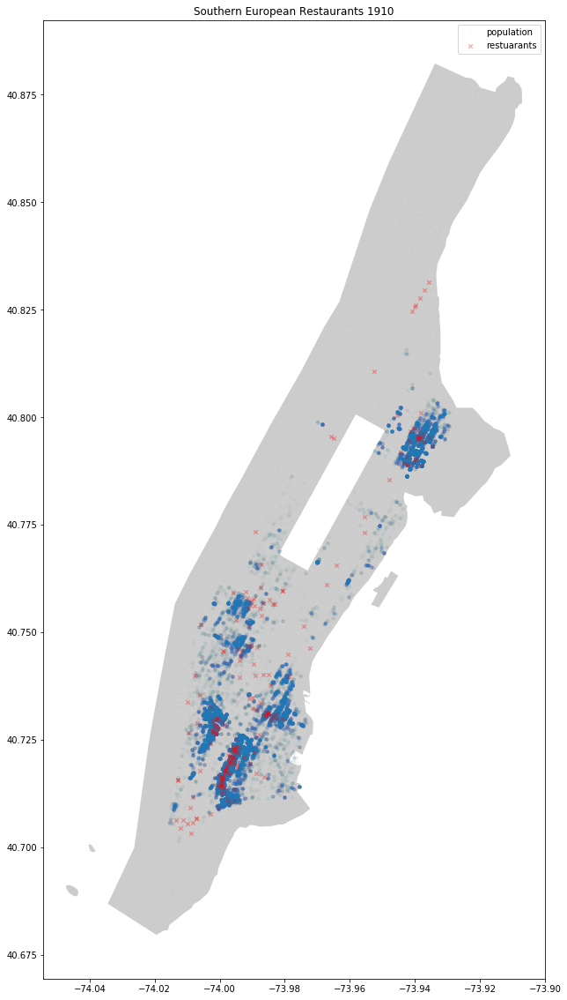

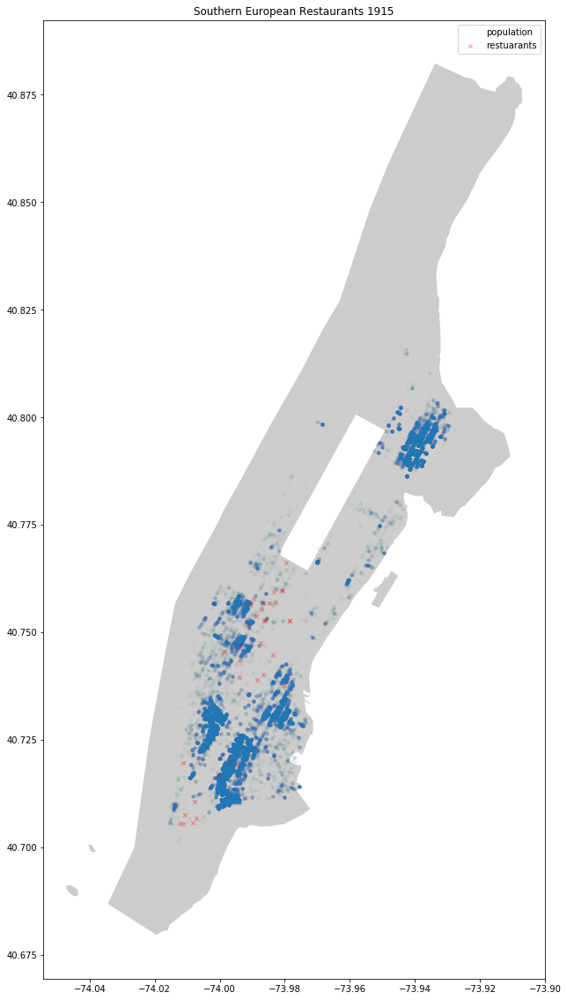

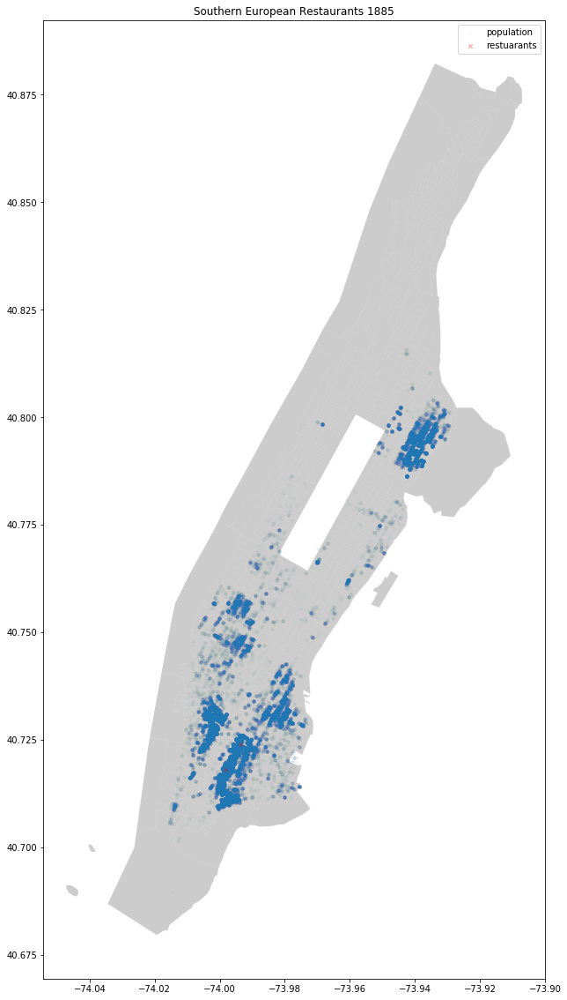

In [83]:
for group in groups:
    
    for year in years:
        
        fig,ax = plt.subplots(figsize=(20,20))
        street_map.plot(ax=ax, alpha=0.4, color='grey')

        x = census[census['Birthplace_group']==group]['Lon']
        y = census[census['Birthplace_group']==group]['Lat']

        x1 = df[(df['census_match_1_group']==group) & (df['YR']==year)]['Lon']
        y1 = df[(df['census_match_1_group']==group) & (df['YR']==year)]['Lat']

        #x2 = df[df['census_match_2_group']==group]['Lon']
        #y2 = df[df['census_match_2_group']==group]['Lat']

        plt.scatter(x, y, label='population', alpha=0.01, marker='o', s=10)
        plt.scatter(x1, y1, label='restuarants', alpha=0.3, marker='x', c='r', s=20)
        #plt.scatter(x2, y2, label='match2', alpha=0.3, marker='x', c='r', s=20)
        plt.title(f'{group} Restaurants {year}')
        plt.legend()

        plt.savefig(f'plots/{group}_{year}.png')